In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
import matplotlib.pyplot as plt
from PIL import Image
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
pictures = os.listdir("../input/Pictures")



In [ ]:
def normalize(array):
    #Convert this to a (0,1) range
    array = (array - array.min())/(255 - array.min())
    #Now convert it into a range of (-1,1)
    array = 2*array - 1
    
    return array

In [ ]:
dataset = []


for picture in pictures[:320]:
    im = Image.open('../input/Pictures/'+picture)
    pix_val = np.array(im.getdata())
    pix_val = pix_val.reshape(64,64,-1)[:,:,:3]
    normalized = normalize(pix_val)
    dataset.append(normalized)
dataset = np.array(dataset)
print(dataset.shape)


In [ ]:
def batch_generator(dataset, index, batch_size):
    data = dataset[(index*batch_size):((index+1)*batch_size)]
    return data

In [ ]:
def model_inputs(real_dim, z_dim):
    input_real = tf.placeholder(tf.float32, shape = (None, *real_dim), name = "real_input")
    input_z = tf.placeholder(tf.float32, shape = (None, z_dim), name = "z_input")
    
    return (input_real , input_z)

In [90]:
def generator(input_z, alpha = 0.2, reuse = False, training = True):
    
    with tf.variable_scope("generator", reuse=reuse):
        
        input_x = tf.layers.dense(input_z, 8*8*1024)
        input_x = tf.reshape(input_x, (-1, 8, 8, 1024))
        input_x = tf.maximum(input_x, alpha*input_x)
        
        first_layer = tf.layers.conv2d_transpose(input_x, 512, 3, strides = 2, padding = 'same')
        first_layer_normal = tf.layers.batch_normalization(first_layer, training = training)
        first_layer_output = tf.maximum(first_layer_normal, alpha*first_layer_normal)
        
        second_layer = tf.layers.conv2d_transpose(first_layer_output, 256, 3, strides = 2, padding = 'same')
        second_layer_normal = tf.layers.batch_normalization(second_layer, training = training )
        second_layer_output = tf.maximum(second_layer_normal, alpha*second_layer_normal)
        
        logits = tf.layers.conv2d_transpose(second_layer_output, 3, 3, strides = 2, padding = 'same')
        out = tf.tanh(logits)
        return(out)  
        

In [95]:
def discriminator(input_x, alpha = 0.2, reuse = True):
    
    with tf.variable_scope("discriminator", reuse=reuse):
        
        first_layer = tf.layers.conv2d(input_x, 128, 3, strides = 2, padding = 'same')
        first_layer_output = tf.maximum(first_layer, alpha*first_layer)
        
        second_layer = tf.layers.conv2d(first_layer_output, 256, 3, strides = 2, padding = 'same')
        second_layer_normal = tf.layers.batch_normalization(second_layer, training = True)
        second_layer_output = tf.maximum(second_layer_normal, alpha * second_layer_normal)
        
        final_layer = tf.layers.conv2d(second_layer_output, 512, 3, strides=2, padding='same')
        final_layer_normal = tf.layers.batch_normalization(final_layer, training = True)
        final_layer_output = tf.maximum(final_layer_normal, alpha*final_layer_normal)
        
        final_layer_output = tf.reshape(final_layer_output, (-1,8*8*512))
        logits = tf.layers.dense(final_layer_output, 1)
        out = tf.sigmoid(logits)
        
        return (logits, out)

In [ ]:
def model_loss(input_real, fake_input, alpha):
    
    g_out = generator(fake_input, alpha)
    d_real_logits, d_real_out = discriminator(input_real, alpha, reuse = False)
    d_fake_logits, d_fake_out = discriminator(g_out, alpha)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_real_logits, labels = tf.ones_like(d_real_out)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_fake_logits, labels = tf.zeros_like(d_fake_out)))
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_fake_logits, labels = tf.ones_like(d_fake_out)))
    d_loss = d_loss_real + d_loss_fake
    
    return (g_loss, d_loss)

In [ ]:
def model_optimizer(g_loss, d_loss, learning_rate, beta1):
    
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_opt = tf.train.AdamOptimizer(learning_rate = learning_rate, beta1 = beta1).minimize(g_loss, var_list = g_vars)
        d_opt = tf.train.AdamOptimizer(learning_rate = learning_rate, beta1 = beta1).minimize(d_loss, var_list = d_vars)
    
    return g_opt, d_opt


In [ ]:
class Generator:
    def __init__(self, real_dim, z_dim, learning_rate, alpha, beta1):
        tf.reset_default_graph()
        self.input_real , self.input_z = model_inputs(real_dim, z_dim)
        self.g_loss, self.d_loss = model_loss(self.input_real, self.input_z, alpha)
        self.g_opt , self.d_opt = model_optimizer(self.g_loss, self.d_loss, learning_rate, beta1)
        

In [ ]:
def view_samples(epoch, samples, nrows, ncols, figsize=(8,8)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

In [97]:
def train(net, data, batch_size, epochs):
    sample_input = np.random.uniform(-1, 1,size=(36, 100))
    loss = []
    samples = []
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for n_epoch in range(1, epochs+1):
            for ii in range(int(len(data)/batch_size)):
                dataset = batch_generator(data, ii, batch_size)
                random_input = np.random.uniform(-1, 1,size=(batch_size, 100))
                
                _ = sess.run(net.d_opt, feed_dict = {net.input_real:dataset, net.input_z:random_input})
                _ = sess.run(net.g_opt, feed_dict = {net.input_real:dataset, net.input_z:random_input})
                

                if n_epoch%1 == 0:
                    train_loss_g = net.g_loss.eval({net.input_z:random_input})
                    train_loss_d = net.d_loss.eval({net.input_real:dataset, net.input_z: random_input})

                    loss.append(train_loss_g)
                    print("Epoch {}/{} Discriminator Loss {:.4f} Generator Loss {:.4f}".format(
                            n_epoch, epochs, train_loss_d, train_loss_g))
                if n_epoch%10 ==0 :
                    gener_samples = sess.run(generator(net.input_z, reuse = True, training = False),feed_dict= {net.input_z:sample_input})
                    fig, axes = view_samples(-1, gener_samples, 6, 6)
                    plt.show()
                    samples.append(gener_samples)
    return samples    

In [88]:
real_dim = (64, 64, 3)
z_dim = 100
batch_size = 64
learning_rate = 0.0001
epochs = 50
alpha = 0.2
beta1 =0.5

Epoch 1/50 Discriminator Loss 11.4933 Generator Loss 0.0001
Epoch 1/50 Discriminator Loss 9.0976 Generator Loss 0.0007
Epoch 1/50 Discriminator Loss 7.9962 Generator Loss 0.0013
Epoch 1/50 Discriminator Loss 7.4929 Generator Loss 0.0013
Epoch 1/50 Discriminator Loss 7.6954 Generator Loss 0.0012
Epoch 2/50 Discriminator Loss 7.8025 Generator Loss 0.0013
Epoch 2/50 Discriminator Loss 8.2254 Generator Loss 0.0015
Epoch 2/50 Discriminator Loss 7.2758 Generator Loss 0.0018
Epoch 2/50 Discriminator Loss 7.0282 Generator Loss 0.0021
Epoch 2/50 Discriminator Loss 6.5486 Generator Loss 0.0042
Epoch 3/50 Discriminator Loss 6.1154 Generator Loss 0.0055
Epoch 3/50 Discriminator Loss 6.1957 Generator Loss 0.0090
Epoch 3/50 Discriminator Loss 6.2699 Generator Loss 0.0115
Epoch 3/50 Discriminator Loss 6.1661 Generator Loss 0.0100
Epoch 3/50 Discriminator Loss 5.8427 Generator Loss 0.0073
Epoch 4/50 Discriminator Loss 4.7709 Generator Loss 0.0210
Epoch 4/50 Discriminator Loss 5.0246 Generator Loss 0.0

/opt/conda/lib/python3.6/site-packages/matplotlib/axes/_base.py:1428: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


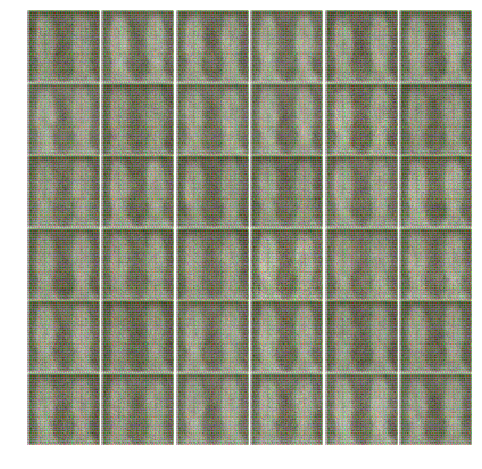

Epoch 10/50 Discriminator Loss 2.9669 Generator Loss 0.7098


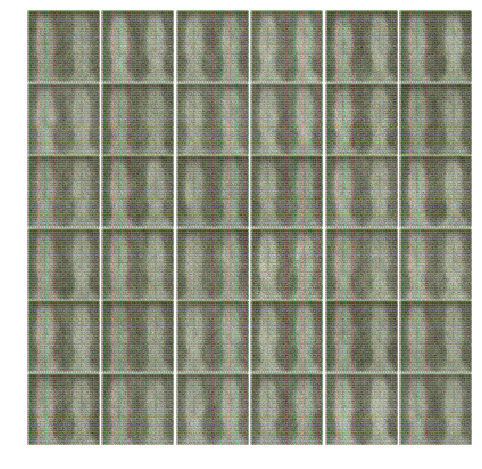

Epoch 10/50 Discriminator Loss 3.6065 Generator Loss 0.0642


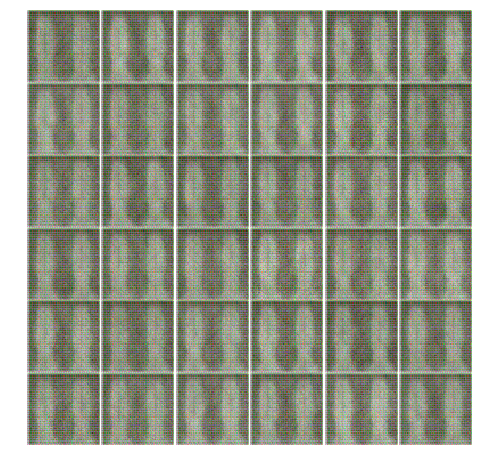

Epoch 10/50 Discriminator Loss 3.0151 Generator Loss 0.6123


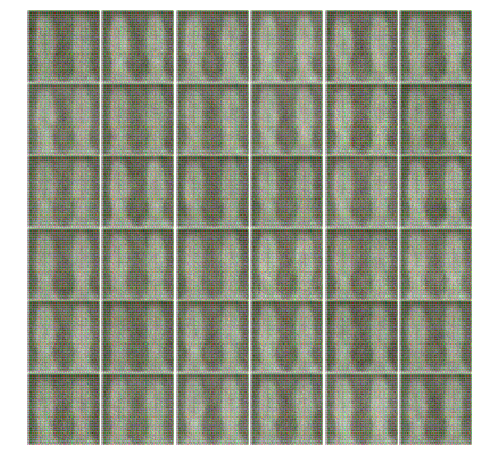

Epoch 10/50 Discriminator Loss 3.2155 Generator Loss 0.1267


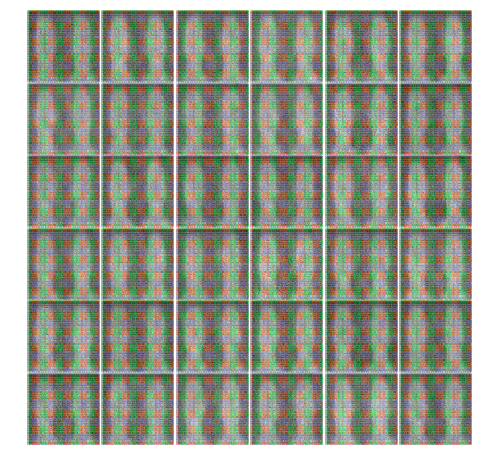

Epoch 11/50 Discriminator Loss 3.2928 Generator Loss 0.2717
Epoch 11/50 Discriminator Loss 3.4025 Generator Loss 0.1967
Epoch 11/50 Discriminator Loss 3.5002 Generator Loss 0.2081
Epoch 11/50 Discriminator Loss 3.2339 Generator Loss 0.3858
Epoch 11/50 Discriminator Loss 2.9798 Generator Loss 0.1527
Epoch 12/50 Discriminator Loss 3.4272 Generator Loss 0.7273
Epoch 12/50 Discriminator Loss 3.4589 Generator Loss 0.0584
Epoch 12/50 Discriminator Loss 3.1088 Generator Loss 0.7768
Epoch 12/50 Discriminator Loss 2.7139 Generator Loss 0.2076
Epoch 12/50 Discriminator Loss 2.8731 Generator Loss 0.6541
Epoch 13/50 Discriminator Loss 2.9077 Generator Loss 0.1261
Epoch 13/50 Discriminator Loss 2.8148 Generator Loss 0.6361
Epoch 13/50 Discriminator Loss 2.8514 Generator Loss 0.1840
Epoch 13/50 Discriminator Loss 2.6725 Generator Loss 0.5979
Epoch 13/50 Discriminator Loss 2.6611 Generator Loss 0.1919
Epoch 14/50 Discriminator Loss 2.6537 Generator Loss 0.4301
Epoch 14/50 Discriminator Loss 2.6578 Ge

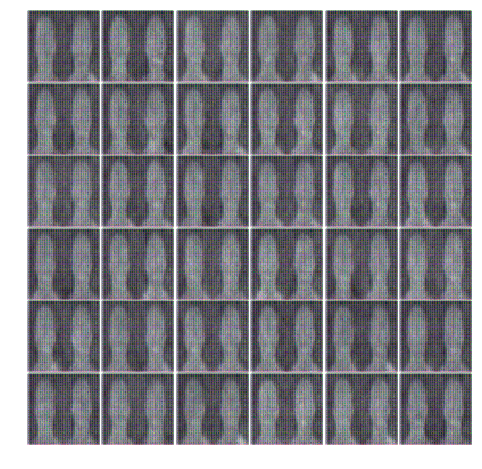

Epoch 20/50 Discriminator Loss 2.0529 Generator Loss 0.2959


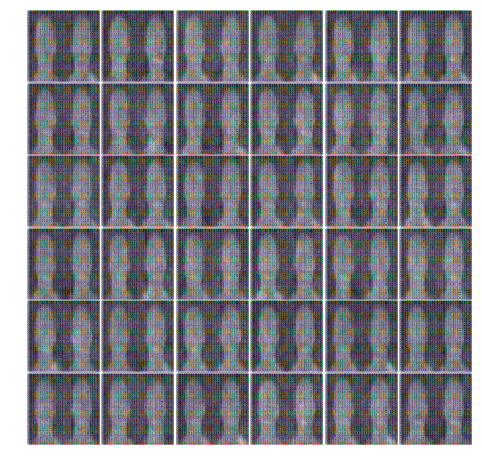

Epoch 20/50 Discriminator Loss 1.9670 Generator Loss 0.5575


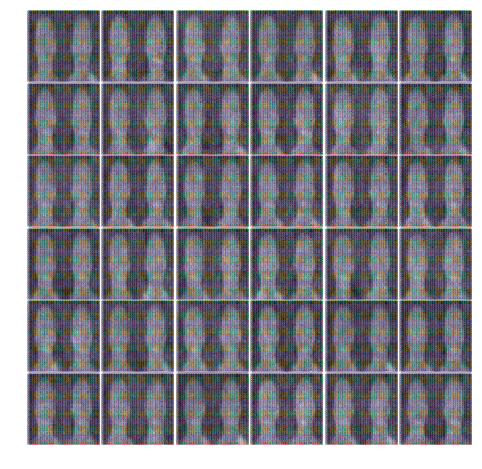

Epoch 20/50 Discriminator Loss 1.8665 Generator Loss 0.3925


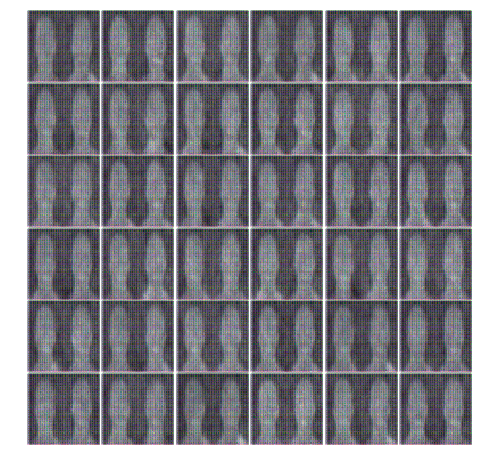

Epoch 20/50 Discriminator Loss 1.9767 Generator Loss 0.6144


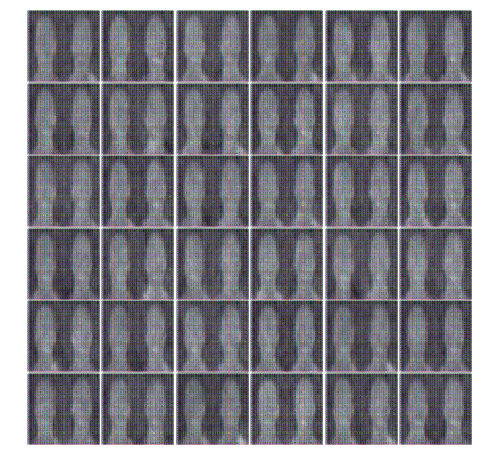

Epoch 21/50 Discriminator Loss 2.0770 Generator Loss 0.2552
Epoch 21/50 Discriminator Loss 2.0664 Generator Loss 0.9255
Epoch 21/50 Discriminator Loss 2.1247 Generator Loss 0.2104
Epoch 21/50 Discriminator Loss 1.9876 Generator Loss 0.8280
Epoch 21/50 Discriminator Loss 1.9804 Generator Loss 0.2899
Epoch 22/50 Discriminator Loss 2.0471 Generator Loss 0.6020
Epoch 22/50 Discriminator Loss 1.9970 Generator Loss 0.3440
Epoch 22/50 Discriminator Loss 1.9556 Generator Loss 0.5264
Epoch 22/50 Discriminator Loss 2.0173 Generator Loss 0.4056
Epoch 22/50 Discriminator Loss 1.9504 Generator Loss 0.4589
Epoch 23/50 Discriminator Loss 1.9032 Generator Loss 0.4074
Epoch 23/50 Discriminator Loss 1.9336 Generator Loss 0.6009
Epoch 23/50 Discriminator Loss 1.9728 Generator Loss 0.3111
Epoch 23/50 Discriminator Loss 1.9852 Generator Loss 0.7897
Epoch 23/50 Discriminator Loss 2.0503 Generator Loss 0.2364
Epoch 24/50 Discriminator Loss 1.9911 Generator Loss 0.8119
Epoch 24/50 Discriminator Loss 1.9220 Ge

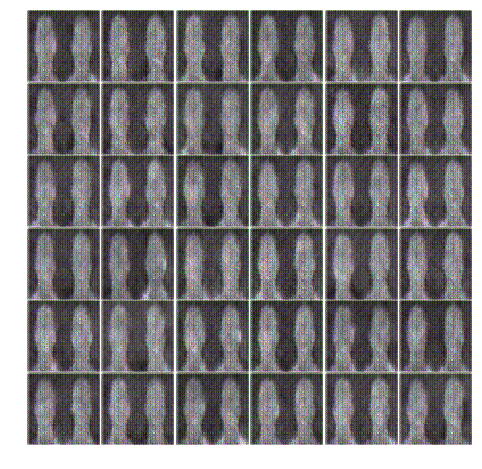

Epoch 30/50 Discriminator Loss 1.8516 Generator Loss 0.4122


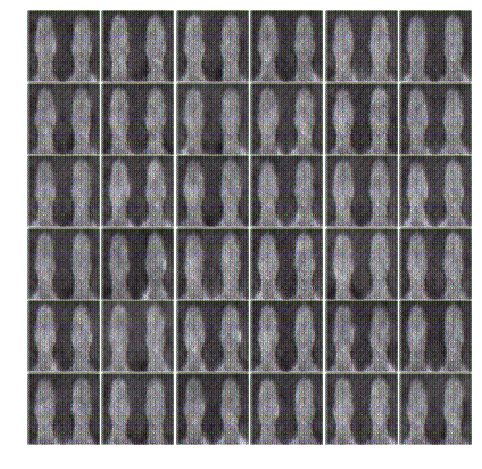

Epoch 30/50 Discriminator Loss 1.8733 Generator Loss 0.5448


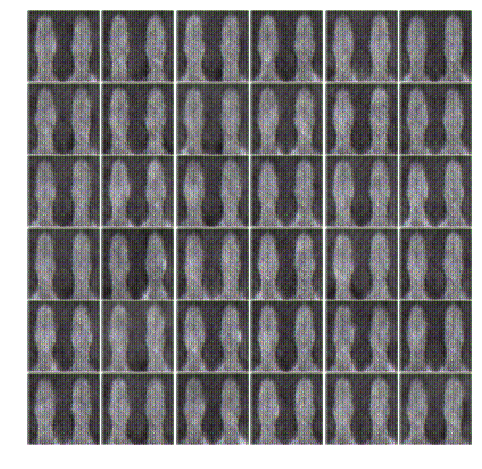

Epoch 30/50 Discriminator Loss 1.8023 Generator Loss 0.4371


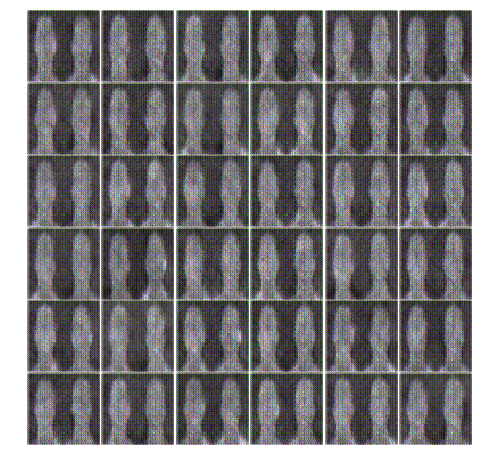

Epoch 30/50 Discriminator Loss 1.6817 Generator Loss 0.5276


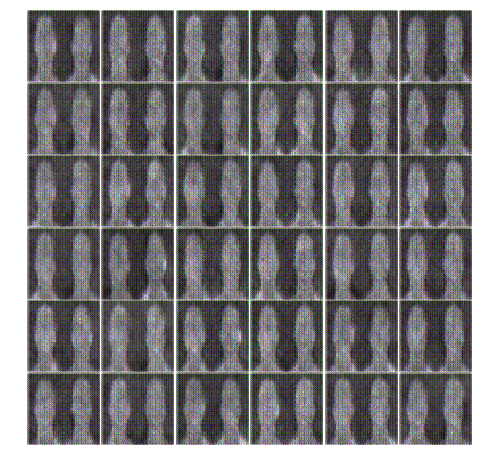

Epoch 31/50 Discriminator Loss 1.7139 Generator Loss 0.6027
Epoch 31/50 Discriminator Loss 1.6748 Generator Loss 0.4449
Epoch 31/50 Discriminator Loss 1.6873 Generator Loss 0.6247
Epoch 31/50 Discriminator Loss 1.7484 Generator Loss 0.4075
Epoch 31/50 Discriminator Loss 1.7481 Generator Loss 0.6662
Epoch 32/50 Discriminator Loss 1.7678 Generator Loss 0.3951
Epoch 32/50 Discriminator Loss 1.8559 Generator Loss 0.6830
Epoch 32/50 Discriminator Loss 1.9425 Generator Loss 0.3079
Epoch 32/50 Discriminator Loss 1.8720 Generator Loss 0.7063
Epoch 32/50 Discriminator Loss 1.8486 Generator Loss 0.3622
Epoch 33/50 Discriminator Loss 1.8008 Generator Loss 0.6915
Epoch 33/50 Discriminator Loss 1.7914 Generator Loss 0.3800
Epoch 33/50 Discriminator Loss 1.8286 Generator Loss 0.6061
Epoch 33/50 Discriminator Loss 1.7791 Generator Loss 0.4300
Epoch 33/50 Discriminator Loss 1.8550 Generator Loss 0.4834
Epoch 34/50 Discriminator Loss 1.8425 Generator Loss 0.5322
Epoch 34/50 Discriminator Loss 1.7746 Ge

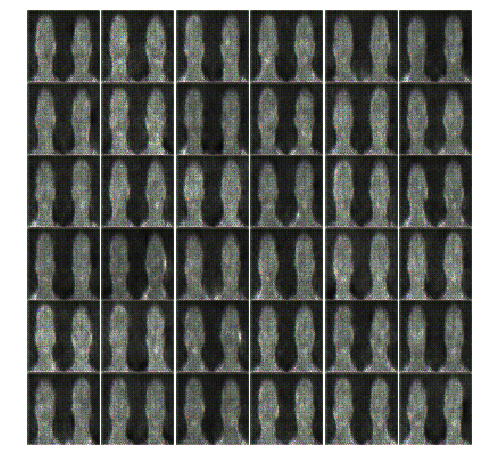

Epoch 40/50 Discriminator Loss 1.7340 Generator Loss 0.4299


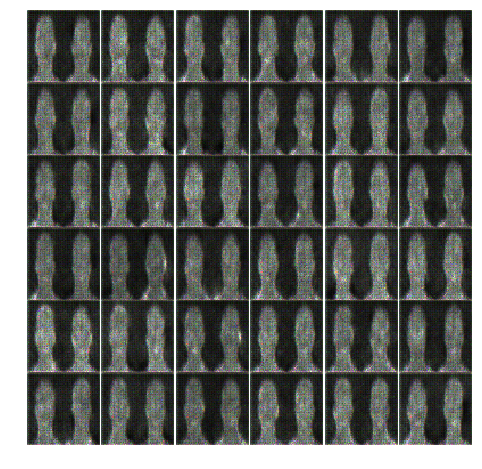

Epoch 40/50 Discriminator Loss 1.8089 Generator Loss 0.6755


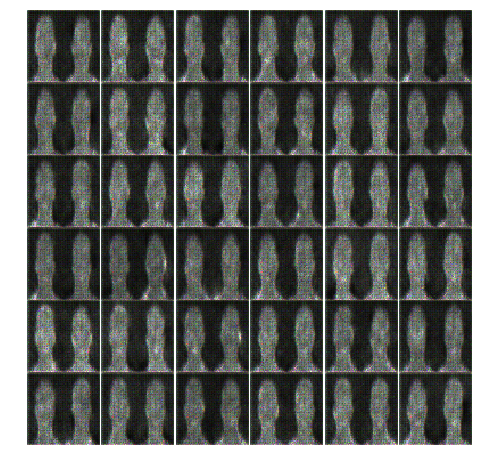

Epoch 40/50 Discriminator Loss 1.8258 Generator Loss 0.3507


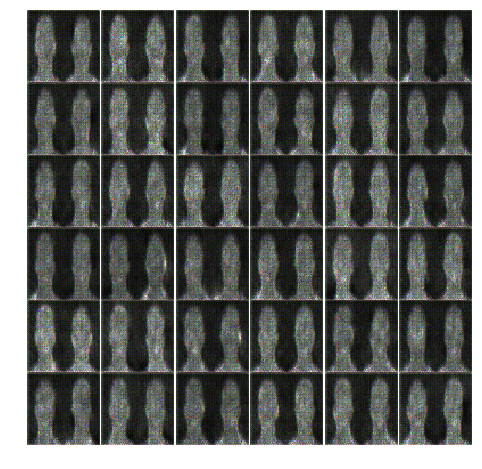

Epoch 40/50 Discriminator Loss 1.8454 Generator Loss 0.7445


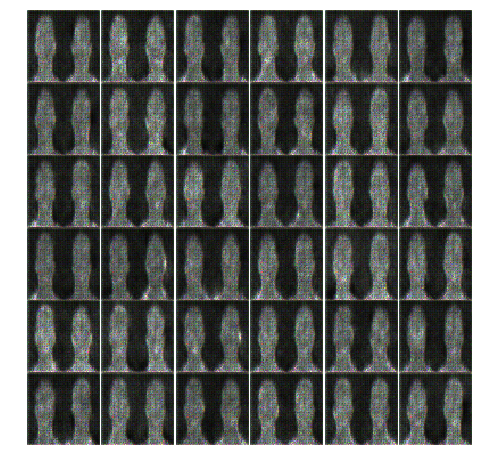

Epoch 41/50 Discriminator Loss 1.8274 Generator Loss 0.3388
Epoch 41/50 Discriminator Loss 1.8309 Generator Loss 0.7459
Epoch 41/50 Discriminator Loss 1.7847 Generator Loss 0.3829
Epoch 41/50 Discriminator Loss 1.8072 Generator Loss 0.6732
Epoch 41/50 Discriminator Loss 1.7771 Generator Loss 0.3846
Epoch 42/50 Discriminator Loss 1.7776 Generator Loss 0.6980
Epoch 42/50 Discriminator Loss 1.7533 Generator Loss 0.4128
Epoch 42/50 Discriminator Loss 1.7224 Generator Loss 0.6791
Epoch 42/50 Discriminator Loss 1.7123 Generator Loss 0.4255
Epoch 42/50 Discriminator Loss 1.7531 Generator Loss 0.6743
Epoch 43/50 Discriminator Loss 1.6976 Generator Loss 0.3936
Epoch 43/50 Discriminator Loss 1.7238 Generator Loss 0.8170
Epoch 43/50 Discriminator Loss 1.6686 Generator Loss 0.3805
Epoch 43/50 Discriminator Loss 1.6816 Generator Loss 0.7757
Epoch 43/50 Discriminator Loss 1.6788 Generator Loss 0.3974
Epoch 44/50 Discriminator Loss 1.7506 Generator Loss 0.7312
Epoch 44/50 Discriminator Loss 1.7180 Ge

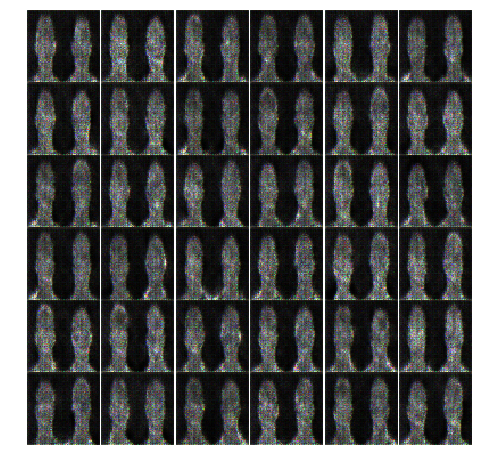

Epoch 50/50 Discriminator Loss 1.7871 Generator Loss 0.3036


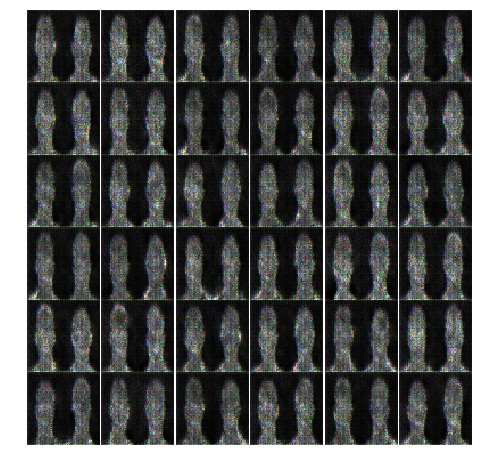

Epoch 50/50 Discriminator Loss 1.7644 Generator Loss 0.8330


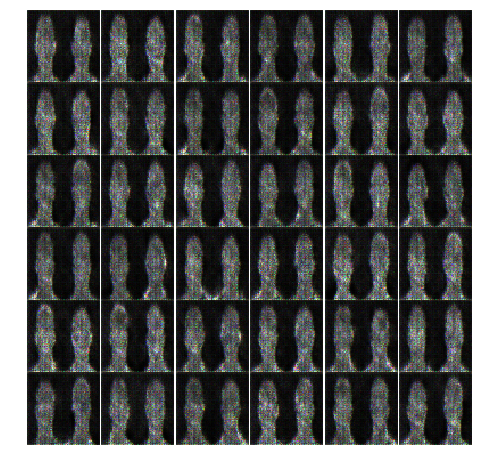

Epoch 50/50 Discriminator Loss 1.6976 Generator Loss 0.3939


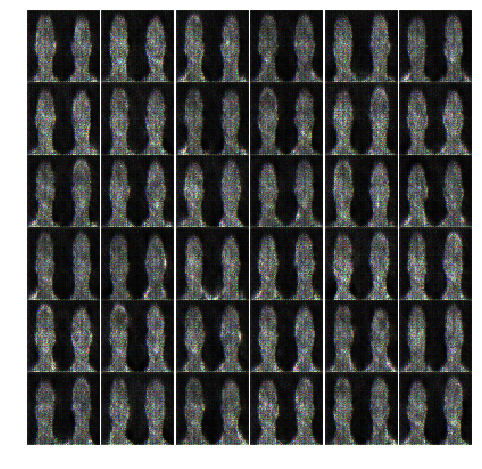

Epoch 50/50 Discriminator Loss 1.7130 Generator Loss 0.6807


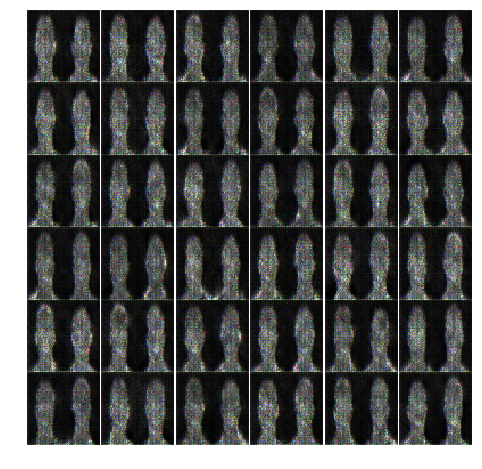

In [99]:
net = Generator(real_dim, z_dim, learning_rate, alpha, beta1)
samples = train(net, dataset, batch_size, epochs)